# Dinomaly V2 — Benchmark complet MVTec AD (15 catégories)

On applique le pipeline retenu sur `cable` (Dinomaly V2 504 + 40 epochs, sans crop) aux **15 catégories MVTec AD** dans une boucle. Chaque catégorie est entraînée séparément (un modèle = une catégorie, c'est le paradigme MVTec).

**Hyperparams identiques** :
- DINOv2-B + registres (`dinov2reg_vit_base_14`)
- Resize 504 sans crop
- BATCH = 4, 40 epochs
- Bottleneck dropout 0.2, decoder depth 8

**Sortie attendue** : un tableau de benchmark complet + heatmaps représentatives par catégorie.

**Coût** : ~10 min par catégorie au premier passage (~2.5 h pour les 15) ; ensuite cache checkpoint → ~30 s par catégorie.

In [2]:
import gc
import sys
import time
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score

PROJECT_ROOT = Path('..').resolve()
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

from src.config import DATA, EDA, PATHS

warnings.filterwarnings('ignore')
sns.set_theme(style=EDA.sns_style, palette=EDA.sns_palette, font_scale=EDA.sns_font_scale)
plt.rcParams['figure.dpi'] = EDA.figure_dpi

# Active les Tensor Cores de la RTX 4060 → matmul 5-10× plus rapides (TF32)
# 'medium' suffit pour du training deep learning standard (AUROC quasi identique).
torch.set_float32_matmul_precision('medium')

# --- Hyperparams (identiques à 04_baseline_dinomaly_cable_v2_40ep) ---
IMG_SIZE = 504
BATCH = 4
MAX_EPOCHS = 40
ENCODER = 'dinov2reg_vit_base_14'
FORCE_RETRAIN = False

print(f'Torch        : {torch.__version__}')
print(f'CUDA dispo   : {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'  GPU        : {torch.cuda.get_device_name(0)}  ({torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB)')
    print(f'  Matmul prec: {torch.get_float32_matmul_precision()}  (Tensor Cores actifs)')
print(f'Setup        : {IMG_SIZE}×{IMG_SIZE}  •  BATCH={BATCH}  •  MAX_EPOCHS={MAX_EPOCHS}')

Torch        : 2.11.0+cu128
CUDA dispo   : True
  GPU        : NVIDIA GeForce RTX 4060 Laptop GPU  (8.6 GB)
  Matmul prec: medium  (Tensor Cores actifs)
Setup        : 504×504  •  BATCH=4  •  MAX_EPOCHS=40


## 1. Constantes & helpers

- Liste des 15 catégories MVTec AD
- Fonction `run_category()` : pipeline complet (datamodule → modèle → train/load → predict → métriques → heatmap fig)
- Gestion mémoire : `del` + `torch.cuda.empty_cache()` entre catégories

In [3]:
from anomalib.data import MVTecAD
from anomalib.engine import Engine
from anomalib.models import Dinomaly
from anomalib.pre_processing import PreProcessor
from anomalib.metrics.pimo.pimo import _AUPIMO
from torchvision.transforms import v2 as T

# Les 15 catégories MVTec AD
MVTEC_CATEGORIES = [
    'bottle', 'cable', 'capsule', 'carpet', 'grid',
    'hazelnut', 'leather', 'metal_nut', 'pill', 'screw',
    'tile', 'toothbrush', 'transistor', 'wood', 'zipper',
]

HEATMAPS_DIR = PATHS.root / 'reports' / 'figures' / 'dinomaly' / 'all_mvtec'
HEATMAPS_DIR.mkdir(parents=True, exist_ok=True)


def _to_display(img_chw):
    img = img_chw.transpose(1, 2, 0)
    img = (img - img.min()) / (img.max() - img.min() + 1e-8)
    return np.clip(img, 0, 1)


def _build_model():
    """Instancie un Dinomaly avec pre_processor custom 504 (sans crop)."""
    custom_pp = PreProcessor(transform=T.Compose([
        T.Resize((IMG_SIZE, IMG_SIZE),
                 interpolation=T.InterpolationMode.BILINEAR, antialias=True),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]))
    return Dinomaly(
        encoder_name=ENCODER,
        bottleneck_dropout=0.2,
        decoder_depth=8,
        pre_processor=custom_pp,
    )


def _make_heatmap_figure(category, images, heatmaps, gt_masks, labels, img_scores,
                          defect_labels, metrics):
    """3 lignes : Normal top-score | Anomal best | Anomal worst."""
    anom_idx = np.where(labels == 1)[0]
    norm_idx = np.where(labels == 0)[0]

    picks = []
    if len(norm_idx) > 0:
        picks.append(('Normal top-score', norm_idx[np.argmax(img_scores[norm_idx])]))
    if len(anom_idx) > 0:
        picks.append(('Anomal best',  anom_idx[np.argmax(img_scores[anom_idx])]))
        picks.append(('Anomal worst', anom_idx[np.argmin(img_scores[anom_idx])]))

    n = len(picks)
    fig, axes = plt.subplots(n, 4, figsize=(13, 2.9 * n))
    if n == 1:
        axes = axes[np.newaxis, :]

    for r, (tag, idx) in enumerate(picks):
        img = _to_display(images[idx])
        heat = heatmaps[idx]
        gt = gt_masks[idx]
        axes[r, 0].imshow(img)
        axes[r, 0].set_title(f'{tag}\n{defect_labels[idx]} · s={img_scores[idx]:.2f}',
                              fontsize=9)
        axes[r, 1].imshow(heat, cmap='jet'); axes[r, 1].set_title('Heatmap', fontsize=9)
        axes[r, 2].imshow(img); axes[r, 2].imshow(heat, cmap='jet', alpha=0.45)
        axes[r, 2].set_title('Overlay', fontsize=9)
        if gt.sum() > 0:
            axes[r, 3].imshow(gt, cmap='gray_r'); axes[r, 3].set_title('GT mask', fontsize=9)
        else:
            axes[r, 3].imshow(np.zeros_like(gt), cmap='gray_r'); axes[r, 3].set_title('(pas de GT)', fontsize=9)
        for c in range(4):
            axes[r, c].set_xticks([]); axes[r, c].set_yticks([])

    fig.suptitle(f'Dinomaly V2 — {category}  '
                 f'(img={metrics["auc_img"]:.3f}, pix={metrics["auc_pix"]:.3f}, '
                 f'AUPIMO={metrics["aupimo"]:.3f})',
                 fontsize=11, fontweight='bold', y=1.005)
    plt.tight_layout()
    return fig


def run_category(category, force_retrain=FORCE_RETRAIN, show=True):
    """Train (or load) Dinomaly V2 40ep on a category, return metrics."""
    print(f'\n{"="*70}\n▶ {category}\n{"="*70}')
    ckpt = (PATHS.root / 'models' / f'dinomaly_{category}_v2_{IMG_SIZE}_{MAX_EPOCHS}ep.ckpt').resolve()

    dm = MVTecAD(
        root=PATHS.mvtec_dir, category=category,
        train_batch_size=BATCH, eval_batch_size=BATCH,
        num_workers=0, seed=DATA.random_seed,
    )
    dm.setup()
    n_train, n_test = len(dm.train_data), len(dm.test_data)

    model = _build_model()
    engine = Engine(
        max_epochs=MAX_EPOCHS, accelerator='auto', devices=1,
        default_root_dir=str(PATHS.root / 'results' / f'dinomaly_{category}_v2_40ep'),
        logger=False,
    )

    # Train or load
    t0 = time.time()
    if not force_retrain and ckpt.exists():
        state = torch.load(ckpt, map_location='cpu', weights_only=True)
        model.load_state_dict(state)
        fit_time = 0.0
        print(f'  ✓ Checkpoint chargé ({ckpt.stat().st_size / 1e6:.0f} MB)')
    else:
        print(f'  Training {MAX_EPOCHS} epochs sur {n_train} images good...')
        engine.fit(model=model, datamodule=dm)
        fit_time = time.time() - t0
        ckpt.parent.mkdir(parents=True, exist_ok=True)
        torch.save(model.state_dict(), ckpt)
        print(f'  Training : {fit_time/60:.1f} min · ckpt saved')

    # Predict
    t0 = time.time()
    predictions = engine.predict(model=model, datamodule=dm)
    inference_time = time.time() - t0

    # Collect arrays
    heatmaps, gt_masks, labels, img_scores, paths, images = [], [], [], [], [], []
    for batch in predictions:
        h = batch.anomaly_map.detach().cpu().numpy()
        if h.ndim == 4: h = h.squeeze(1)
        heatmaps.append(h)
        gm = batch.gt_mask.detach().cpu().numpy()
        if gm.ndim == 4: gm = gm.squeeze(1)
        gt_masks.append(gm.astype(np.float32))
        labels.append(batch.gt_label.detach().cpu().numpy().astype(int))
        img_scores.append(batch.pred_score.detach().cpu().numpy())
        paths.extend(batch.image_path)
        images.append(batch.image.detach().cpu().numpy())
    heatmaps = np.concatenate(heatmaps, axis=0)
    gt_masks = np.concatenate(gt_masks, axis=0)
    labels   = np.concatenate(labels,   axis=0)
    img_scores = np.concatenate(img_scores, axis=0)
    images   = np.concatenate(images,   axis=0)
    defect_labels = [Path(p).parent.name for p in paths]

    # Metrics
    auc_img = roc_auc_score(labels, img_scores)
    is_anom = labels == 1
    auc_pix = roc_auc_score(gt_masks[is_anom].flatten(),
                            heatmaps[is_anom].flatten()) if is_anom.sum() > 0 else np.nan
    metric = _AUPIMO(fpr_bounds=(1e-5, 1e-4), return_average=False, force=True)
    metric.update(torch.from_numpy(heatmaps).float(), torch.from_numpy(gt_masks).long())
    _, ar = metric.compute()
    aupimos = ar.aupimos
    aupimo = aupimos[~torch.isnan(aupimos)].mean().item() if (~torch.isnan(aupimos)).any() else np.nan

    # Per-defect AUROC
    defect_arr = np.array(defect_labels)
    per_defect = {}
    for lbl in sorted(set(defect_arr) - {'good'}):
        mask_lbl = (defect_arr == lbl) | (defect_arr == 'good')
        if (defect_arr == lbl).sum() > 0:
            per_defect[lbl] = float(roc_auc_score(labels[mask_lbl], img_scores[mask_lbl]))

    metrics = {
        'category': category, 'n_train': n_train, 'n_test': n_test,
        'n_anom': int(labels.sum()), 'n_good': int((labels == 0).sum()),
        'n_defect_types': len(per_defect),
        'auc_img': auc_img, 'auc_pix': auc_pix, 'aupimo': aupimo,
        'fit_time_s': fit_time, 'inference_time_s': inference_time,
        'per_defect': per_defect,
    }
    print(f'  AUROC img={auc_img:.4f} · pix={auc_pix:.4f} · AUPIMO={aupimo:.4f}  '
          f'(inference {inference_time:.1f}s)')

    # Heatmaps
    fig = _make_heatmap_figure(category, images, heatmaps, gt_masks, labels, img_scores,
                                defect_labels, metrics)
    out_png = HEATMAPS_DIR / f'{category}.png'
    fig.savefig(out_png, dpi=120, bbox_inches='tight', facecolor='white')
    if show:
        plt.show()
    else:
        plt.close(fig)

    # Cleanup
    del model, dm, engine, predictions, heatmaps, gt_masks, labels, img_scores, images
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return metrics


print(f'{len(MVTEC_CATEGORIES)} catégories à traiter :', ', '.join(MVTEC_CATEGORIES))

W0513 18:57:15.376000 38436 Lib\site-packages\torch\utils\flop_counter.py:29] triton not found; flop counting will not work for triton kernels


15 catégories à traiter : bottle, cable, capsule, carpet, grid, hazelnut, leather, metal_nut, pill, screw, tile, toothbrush, transistor, wood, zipper


## 2. Boucle sur les 15 catégories

Premier passage : ~10 min/catégorie (training). Passages suivants : ~30 s (cache checkpoint).


▶ bottle


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
ckpt_path is not provided. Model weights will not be loaded.


  ✓ Checkpoint chargé (592 MB)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

Metric `_AUPIMO` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.


  AUROC img=1.0000 · pix=0.9907 · AUPIMO=0.9524  (inference 11.7s)


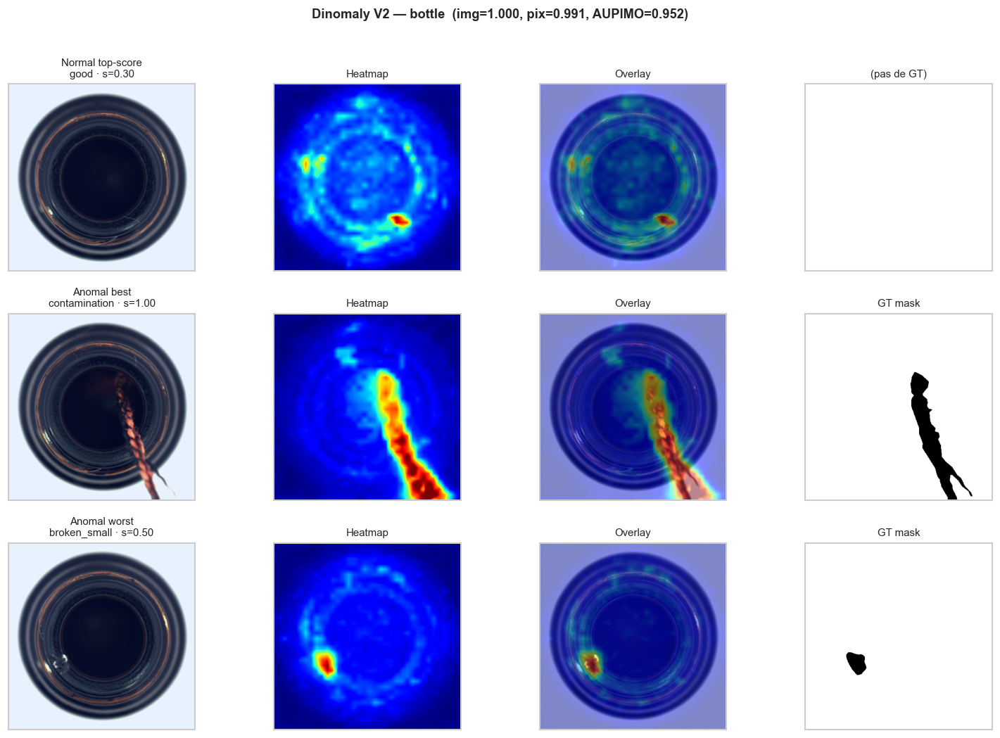


▶ cable


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
ckpt_path is not provided. Model weights will not be loaded.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


  ✓ Checkpoint chargé (592 MB)


Output()

Metric `_AUPIMO` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.


  AUROC img=1.0000 · pix=0.9842 · AUPIMO=0.7076  (inference 24.3s)


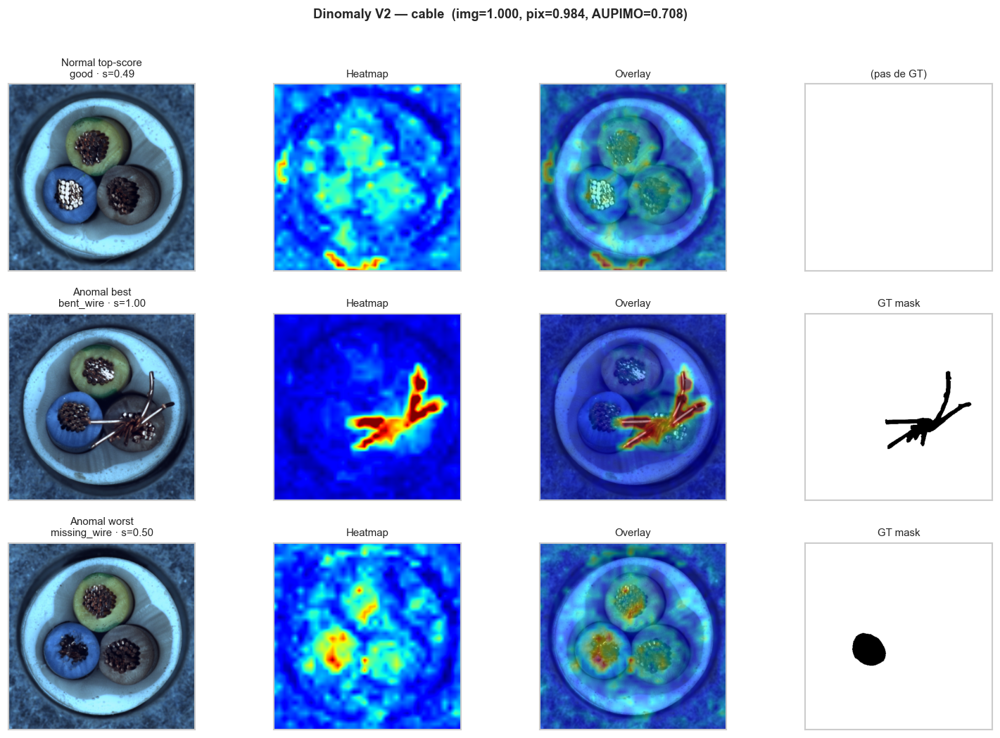


▶ capsule


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
ckpt_path is not provided. Model weights will not be loaded.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


  ✓ Checkpoint chargé (592 MB)


Output()

Metric `_AUPIMO` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.


  AUROC img=0.9868 · pix=0.9870 · AUPIMO=0.7181  (inference 21.8s)


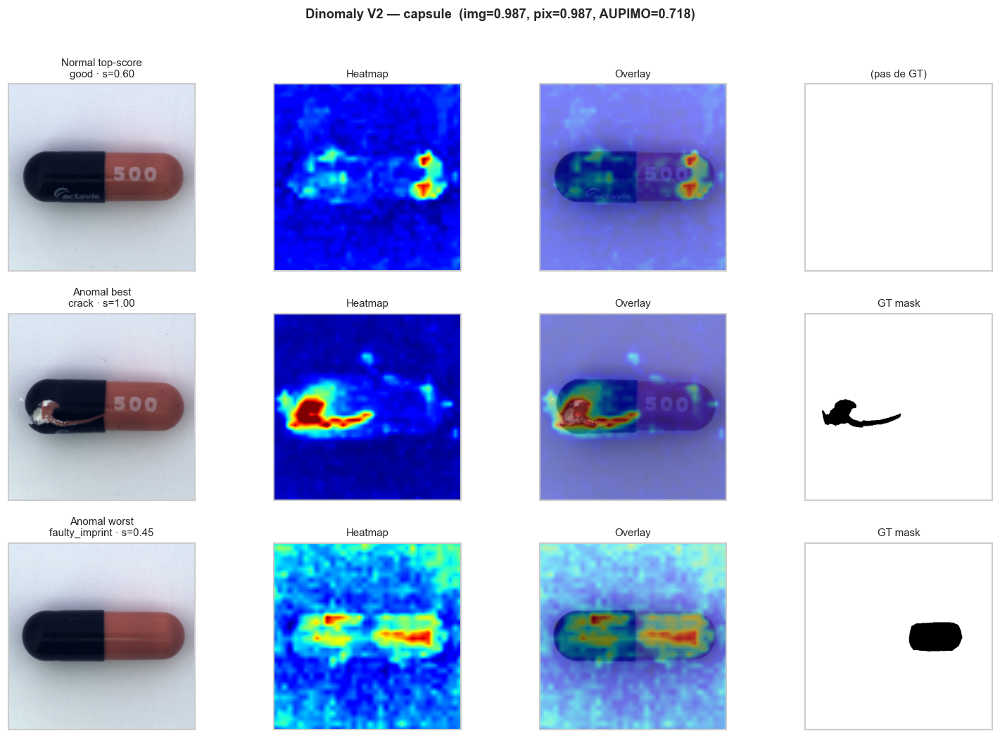


▶ carpet


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
ckpt_path is not provided. Model weights will not be loaded.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


  ✓ Checkpoint chargé (592 MB)


Output()

Metric `_AUPIMO` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.


  AUROC img=1.0000 · pix=0.9927 · AUPIMO=0.8815  (inference 20.2s)


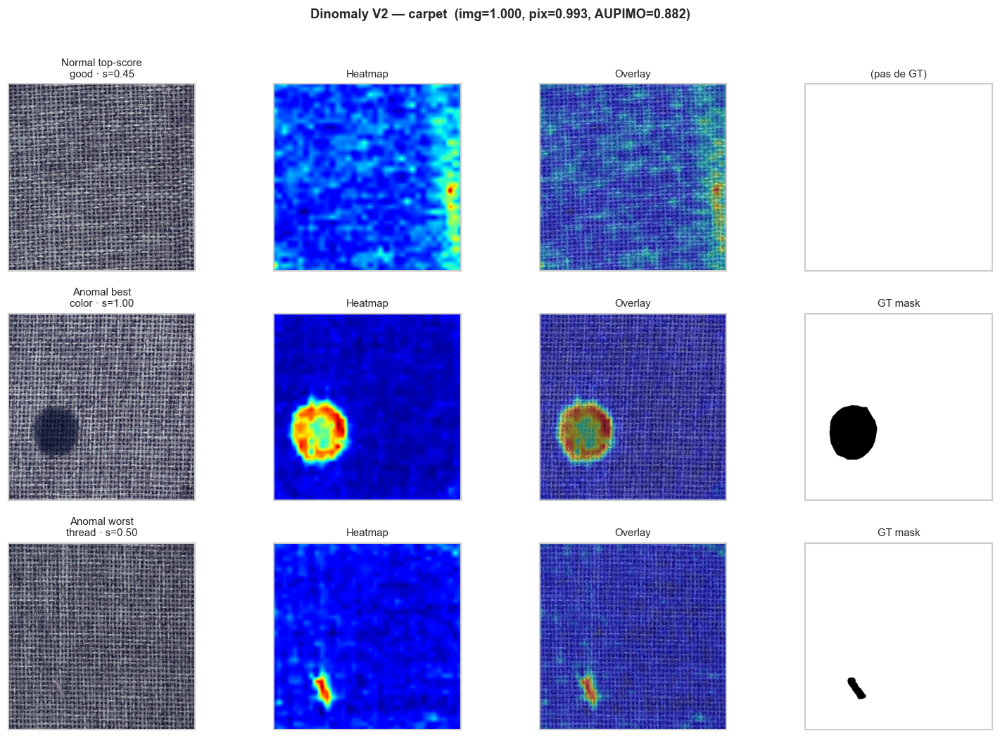


▶ grid


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
ckpt_path is not provided. Model weights will not be loaded.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


  ✓ Checkpoint chargé (592 MB)


Output()

Metric `_AUPIMO` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.


  AUROC img=1.0000 · pix=0.9936 · AUPIMO=0.9980  (inference 10.5s)


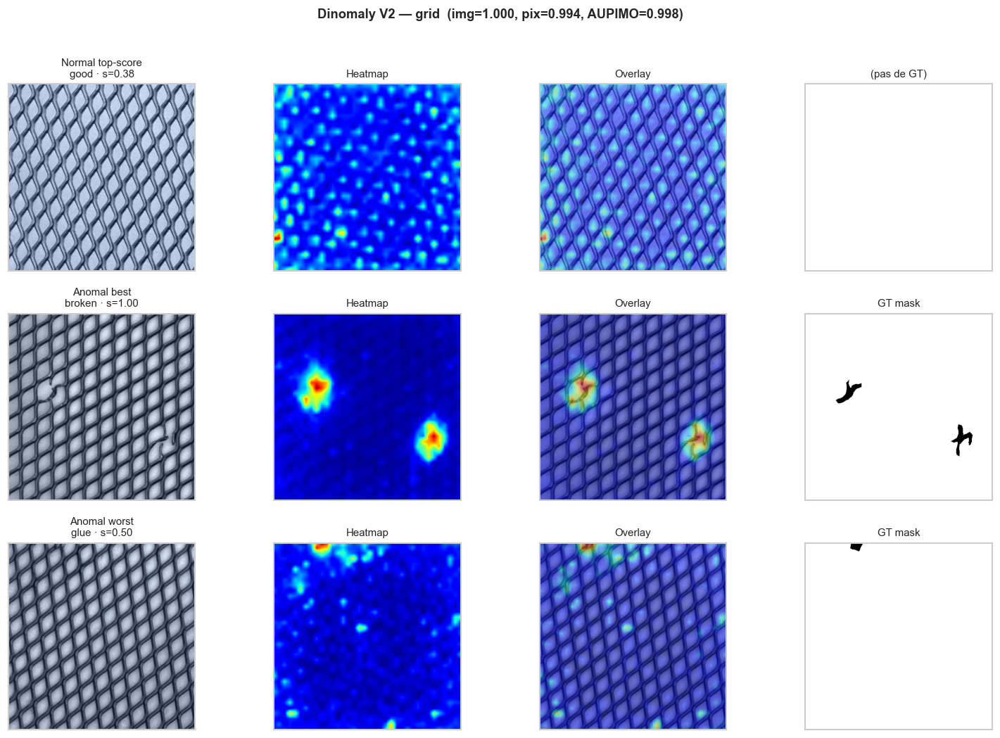


▶ hazelnut


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
ckpt_path is not provided. Model weights will not be loaded.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


  ✓ Checkpoint chargé (592 MB)


Output()

Metric `_AUPIMO` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.


  AUROC img=1.0000 · pix=0.9935 · AUPIMO=0.9319  (inference 18.2s)


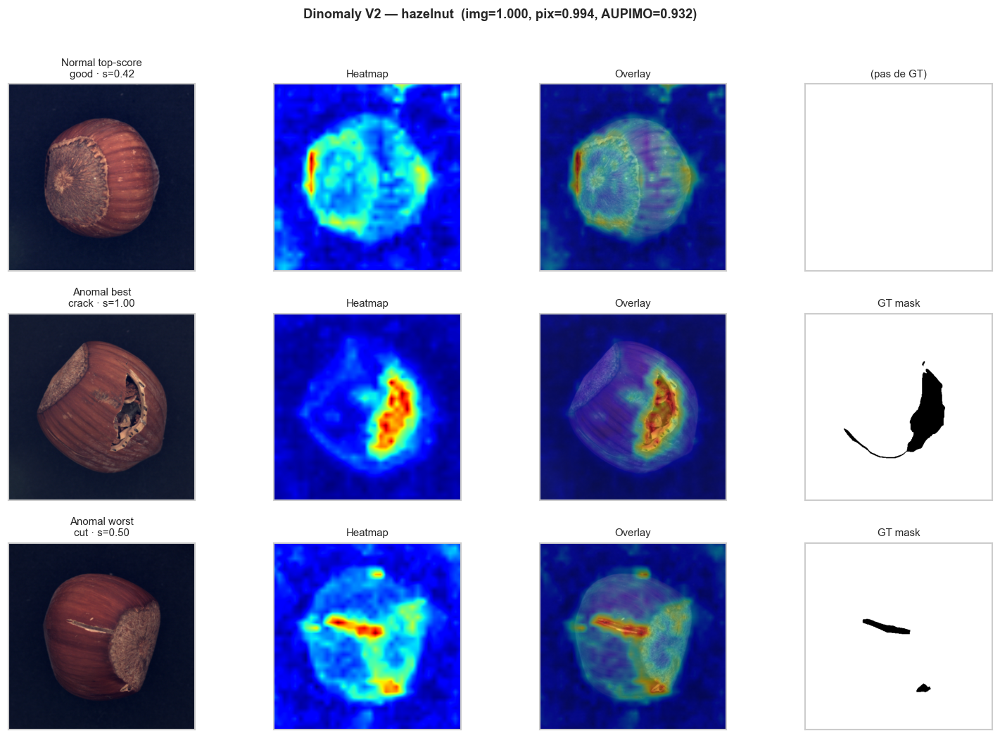


▶ leather


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
ckpt_path is not provided. Model weights will not be loaded.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


  ✓ Checkpoint chargé (592 MB)


Output()

Metric `_AUPIMO` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.


  AUROC img=1.0000 · pix=0.9918 · AUPIMO=0.9997  (inference 19.6s)


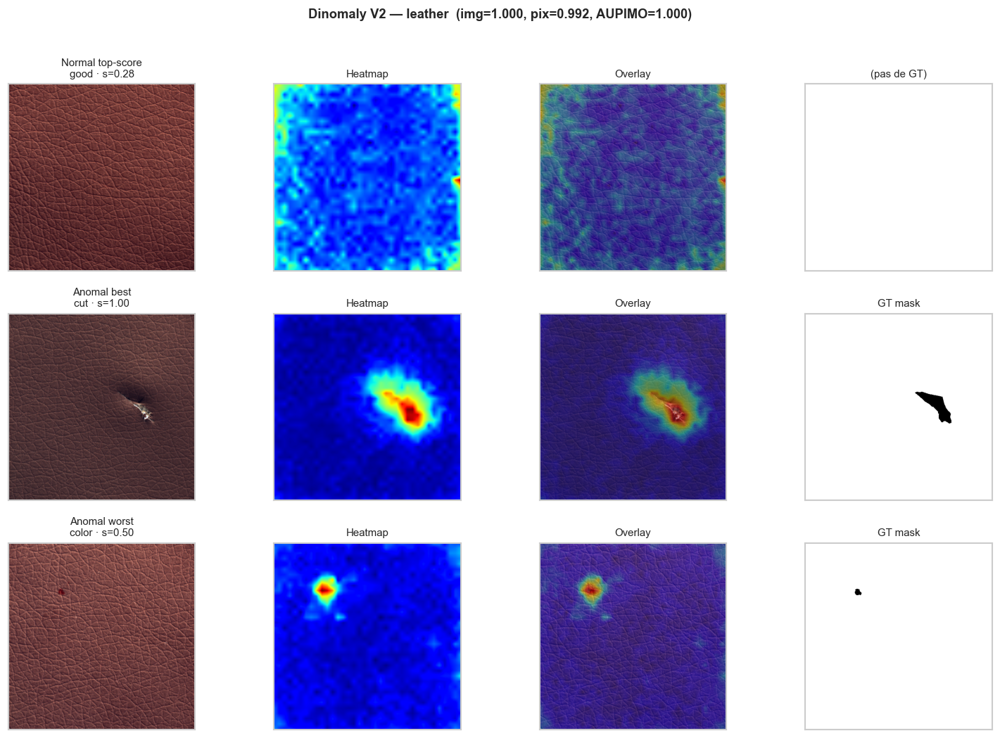


▶ metal_nut


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


  Training 40 epochs sur 220 images good...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name              ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor     │ PreProcessor  │      0 │ train │     0 │
│ 1 │ post_processor    │ PostProcessor │      0 │ train │     0 │
│ 2 │ evaluator         │ Evaluator     │      0 │ train │     0 │
│ 3 │ model             │ DinomalyModel │  147 M │ train │     0 │
│ 4 │ trainable_modules │ ModuleList    │ 61.4 M │ train │     0 │
└───┴───────────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 61.4 M                                                                                           
Non-trainable params: 86.6 M                                                                                       
Total params: 147 M                                                                                                
Total estimated model params size (MB): 591                                                                        
Modules in train mode: 337                                                                                         
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

`Trainer.fit` stopped: `max_epochs=40` reached.


ckpt_path is not provided. Model weights will not be loaded.


  Training : 26.5 min · ckpt saved


The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

Metric `_AUPIMO` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.


  AUROC img=1.0000 · pix=0.9753 · AUPIMO=0.9391  (inference 15.2s)


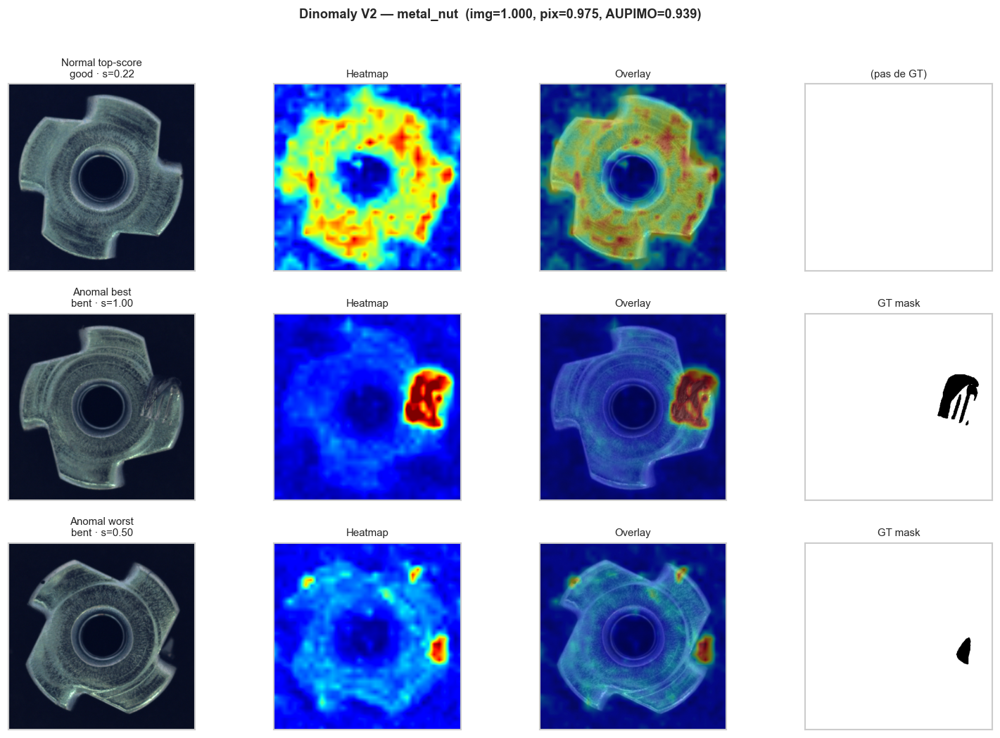


▶ pill


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


  Training 40 epochs sur 267 images good...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name              ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor     │ PreProcessor  │      0 │ train │     0 │
│ 1 │ post_processor    │ PostProcessor │      0 │ train │     0 │
│ 2 │ evaluator         │ Evaluator     │      0 │ train │     0 │
│ 3 │ model             │ DinomalyModel │  147 M │ train │     0 │
│ 4 │ trainable_modules │ ModuleList    │ 61.4 M │ train │     0 │
└───┴───────────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 61.4 M                                                                                           
Non-trainable params: 86.6 M                                                                                       
Total params: 147 M                                                                                                
Total estimated model params size (MB): 591                                                                        
Modules in train mode: 337                                                                                         
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

`Trainer.fit` stopped: `max_epochs=40` reached.


ckpt_path is not provided. Model weights will not be loaded.


  Training : 33.1 min · ckpt saved


The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

Metric `_AUPIMO` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.


  AUROC img=0.9956 · pix=0.9799 · AUPIMO=0.7476  (inference 23.9s)


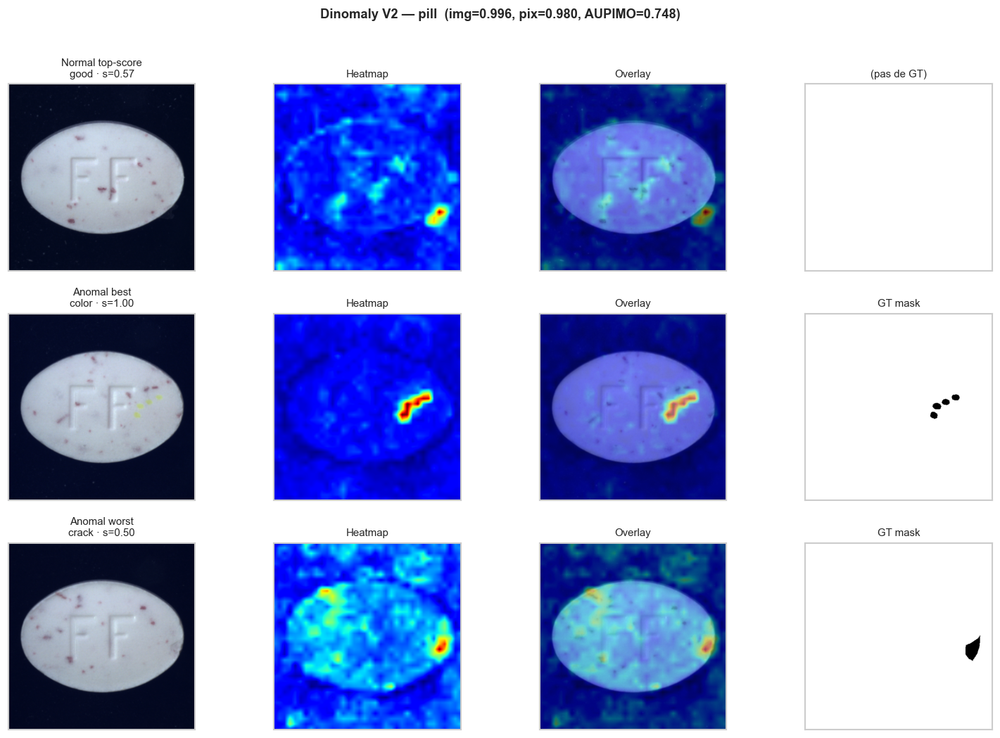


▶ screw
  Training 40 epochs sur 320 images good...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name              ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor     │ PreProcessor  │      0 │ train │     0 │
│ 1 │ post_processor    │ PostProcessor │      0 │ train │     0 │
│ 2 │ evaluator         │ Evaluator     │      0 │ train │     0 │
│ 3 │ model             │ DinomalyModel │  147 M │ train │     0 │
│ 4 │ trainable_modules │ ModuleList    │ 61.4 M │ train │     0 │
└───┴───────────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 61.4 M                                                                                           
Non-trainable params: 86.6 M                                                                                       
Total params: 147 M                                                                                                
Total estimated model params size (MB): 591                                                                        
Modules in train mode: 337                                                                                         
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

`Trainer.fit` stopped: `max_epochs=40` reached.


ckpt_path is not provided. Model weights will not be loaded.


  Training : 36.3 min · ckpt saved


The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

Metric `_AUPIMO` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.


  AUROC img=0.9816 · pix=0.9961 · AUPIMO=0.6626  (inference 21.5s)


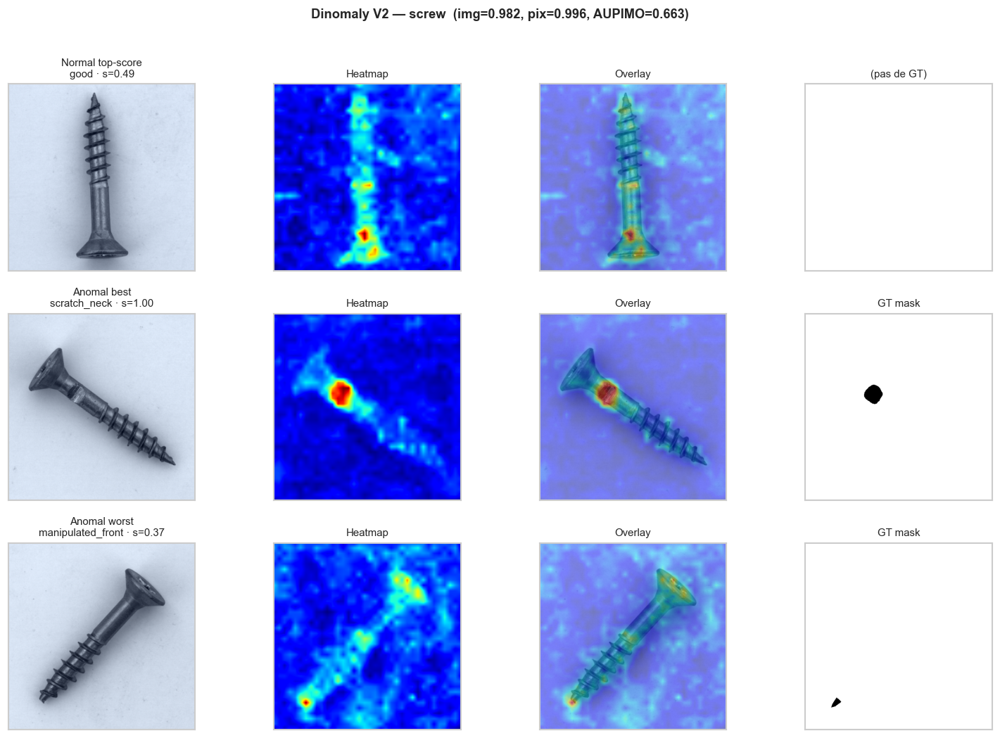


▶ tile
  Training 40 epochs sur 230 images good...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name              ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor     │ PreProcessor  │      0 │ train │     0 │
│ 1 │ post_processor    │ PostProcessor │      0 │ train │     0 │
│ 2 │ evaluator         │ Evaluator     │      0 │ train │     0 │
│ 3 │ model             │ DinomalyModel │  147 M │ train │     0 │
│ 4 │ trainable_modules │ ModuleList    │ 61.4 M │ train │     0 │
└───┴───────────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 61.4 M                                                                                           
Non-trainable params: 86.6 M                                                                                       
Total params: 147 M                                                                                                
Total estimated model params size (MB): 591                                                                        
Modules in train mode: 337                                                                                         
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

`Trainer.fit` stopped: `max_epochs=40` reached.


ckpt_path is not provided. Model weights will not be loaded.


  Training : 28.9 min · ckpt saved


The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

Metric `_AUPIMO` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.


  AUROC img=1.0000 · pix=0.9708 · AUPIMO=0.9681  (inference 17.8s)


In [ ]:
all_results = []
t_total = time.time()
for cat in MVTEC_CATEGORIES:
    try:
        m = run_category(cat, show=True)
        all_results.append(m)
    except Exception as e:
        print(f'  ❌ Erreur sur {cat}: {type(e).__name__}: {e}')
        all_results.append({'category': cat, 'error': str(e)})
print(f'\n{"="*70}\nTotal : {len(all_results)} catégories en {(time.time() - t_total)/60:.1f} min\n{"="*70}')

## 3. Tableau de benchmark

In [1]:
df = pd.DataFrame([
    {k: v for k, v in r.items() if k != 'per_defect'} for r in all_results if 'error' not in r
])
df = df.sort_values('auc_img', ascending=False).reset_index(drop=True)
df_display = df[['category', 'n_train', 'n_test', 'n_anom', 'n_defect_types',
                  'auc_img', 'auc_pix', 'aupimo', 'fit_time_s']].copy()
df_display['auc_img'] = df_display['auc_img'].round(4)
df_display['auc_pix'] = df_display['auc_pix'].round(4)
df_display['aupimo'] = df_display['aupimo'].round(4)
df_display['fit_time_min'] = (df_display['fit_time_s'] / 60).round(1)
df_display = df_display.drop(columns=['fit_time_s'])
print('=== Benchmark Dinomaly V2 (504, 40ep) sur MVTec AD ===\n')
print(df_display.to_string(index=False))

# Moyennes
print(f'\n--- Moyennes ---')
print(f'AUROC image  : {df["auc_img"].mean():.4f}  (min {df["auc_img"].min():.4f} · max {df["auc_img"].max():.4f})')
print(f'AUROC pixel  : {df["auc_pix"].mean():.4f}  (min {df["auc_pix"].min():.4f} · max {df["auc_pix"].max():.4f})')
print(f'AUPIMO       : {df["aupimo"].mean():.4f}  (min {df["aupimo"].min():.4f} · max {df["aupimo"].max():.4f})')

NameError: name 'pd' is not defined

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Bar AUROC image / pixel par catégorie
df_sorted = df.sort_values('auc_img')
yp = np.arange(len(df_sorted))
h = 0.4
axes[0].barh(yp - h/2, df_sorted['auc_img'], height=h,
             color=EDA.color_mvtec, label='AUROC image', edgecolor='black', linewidth=0.3)
axes[0].barh(yp + h/2, df_sorted['auc_pix'], height=h,
             color=EDA.color_anomal, label='AUROC pixel', edgecolor='black', linewidth=0.3)
axes[0].set_yticks(yp); axes[0].set_yticklabels(df_sorted['category'])
axes[0].set_xlim(0.5, 1.02); axes[0].axvline(1.0, color='gray', lw=0.4, ls='--')
axes[0].set_title('AUROC par catégorie', fontweight='bold')
axes[0].legend(loc='lower right', fontsize=9)
sns.despine(ax=axes[0])

# AUPIMO
df_sorted2 = df.sort_values('aupimo')
yp2 = np.arange(len(df_sorted2))
axes[1].barh(yp2, df_sorted2['aupimo'], height=0.6,
             color=EDA.color_hssiad, edgecolor='black', linewidth=0.3)
for i, v in enumerate(df_sorted2['aupimo']):
    axes[1].text(v + 0.01, yp2[i], f'{v:.3f}', va='center', fontsize=8.5)
axes[1].set_yticks(yp2); axes[1].set_yticklabels(df_sorted2['category'])
axes[1].set_xlim(0, max(1.0, df_sorted2['aupimo'].max() * 1.1))
axes[1].set_title('AUPIMO par catégorie', fontweight='bold')
sns.despine(ax=axes[1])

plt.suptitle('Dinomaly V2 (504, 40ep) — Benchmark MVTec AD',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout(); plt.show()

## 4. AUROC par type de défaut (toutes catégories confondues)

In [ ]:
rows = []
for r in all_results:
    if 'per_defect' not in r:
        continue
    for defect, auc in r['per_defect'].items():
        rows.append({'category': r['category'], 'défaut': defect, 'AUROC': round(auc, 3)})
df_def = pd.DataFrame(rows).sort_values(['category', 'AUROC'])
print(f'=== {len(df_def)} (catégorie, défaut) — Dinomaly V2 ===')
print(df_def.to_string(index=False))

# Histogramme des AUROC par défaut
fig, ax = plt.subplots(figsize=(8, 4))
ax.hist(df_def['AUROC'], bins=20, color=EDA.color_mvtec, edgecolor='black', linewidth=0.4)
ax.set_xlabel('AUROC par (catégorie, défaut)')
ax.set_ylabel('Nombre de défauts')
ax.set_title('Distribution des AUROC sur tous les défauts MVTec', fontweight='bold')
n_perfect = (df_def['AUROC'] >= 0.999).sum()
ax.axvline(0.999, color=EDA.color_anomal, ls='--', lw=1.5,
           label=f'AUROC ≥ 0.999 : {n_perfect}/{len(df_def)}')
ax.legend(loc='upper left', fontsize=9)
sns.despine(ax=ax); plt.tight_layout(); plt.show()

print(f'\n→ {n_perfect}/{len(df_def)} (catégorie, défaut) ont un AUROC ≥ 0.999')
print(f'→ Défauts les plus difficiles (AUROC < 0.95) :')
weak = df_def[df_def['AUROC'] < 0.95]
if len(weak) > 0:
    print(weak.to_string(index=False))
else:
    print('  (aucun)')

## 5. Export CSV pour le portfolio

In [ ]:
out_csv = PATHS.root / 'reports' / 'mvtec_dinomaly_v2_benchmark.csv'
df_display.to_csv(out_csv, index=False)
print(f'✓ Benchmark sauvegardé : {out_csv.relative_to(PATHS.root)}')

out_csv_def = PATHS.root / 'reports' / 'mvtec_dinomaly_v2_per_defect.csv'
df_def.to_csv(out_csv_def, index=False)
print(f'✓ Per-defect sauvegardé : {out_csv_def.relative_to(PATHS.root)}')

print(f'\nHeatmaps sauvegardées dans : {HEATMAPS_DIR.relative_to(PATHS.root)}')

## 6. Conclusions (à remplir après exécution)

**Questions à trancher :**

| Question | À compléter |
|---|---|
| Catégories à AUROC image = 1.000 | … / 15 |
| Catégories les plus difficiles (AUROC < 0.99) | … |
| AUROC image moyen sur MVTec | … (référence Dinomaly papier ≈ 0.99+) |
| AUROC pixel moyen | … (référence ≈ 0.98+) |
| AUPIMO moyen | … (référence ≈ 0.85+) |
| Types de défauts qui restent difficiles | … |

**Si benchmark à hauteur du papier (~0.99 mean image AUROC)** → Dinomaly V2 est validé comme baseline générale, prêt pour l'extension à HSS-IAD et la démo.

**Si écart significatif sur certaines catégories** → analyser les heatmaps + per-defect, identifier les patterns (textures vs objets orientés, défauts subtils, etc.) et décider d'un fine-tuning par catégorie ou d'un changement de hyperparam.